In [22]:
using Plots, StatsPlots, StatsBase, LaTeXStrings, Random, Distributions, JLD2, LsqFit, Plots.PlotMeasures
path = "C:\\Users\\lucy_\\bats\\radiotrack\\"

"C:\\Users\\lucy_\\bats\\radiotrack\\"

In [2]:

@load "radiotrack.jld2" t meansd semsd stdsd
t_rt = t 
msd_rt = meansd;
sem_rt = semsd;
std_rt = stdsd;

In [31]:
function diffusion_step(D,dt,x,y)
    return x + rand(Normal(0,sqrt(2*D*dt))), y + rand(Normal(0,sqrt(2*D*dt)))
end

function drift_step(D,chi,dt,ts,tD,x,y,r_threshold,r_exp)
    r = sqrt(x^2+y^2)
    if r > r_threshold 
        xdir = x/sqrt(x^2+y^2)
        ydir = y/sqrt(x^2+y^2)
        return x - rand(Normal(xdir*chi*dt*(r^r_exp),sqrt(2*D*dt))), y - rand(Normal(ydir*chi*dt*(r^r_exp),sqrt(2*D*dt)))
    else
        return 0,0
    end
end

function leapfrog_sim(D1,D2,chi,t,N,N_scouts,tD,start_time,r_threshold,r_exp)
    r_threshold = 10
    r_exp = -2
    x = Array{Float64}(undef,N,length(t))
    x.=0
    y = Array{Float64}(undef,N,length(t))
    y.=0
    for (j,ts) in enumerate(t[1:end-1]) 
        idx = sortperm(x[:,j].^2 + y[:,j].^2)[end-N_scouts:end]
        for i = 1:N
            if ts < tD
                x[i,j+1],y[i,j+1] = diffusion_step(D1,dt,x[i,j],y[i,j])
            elseif any(x->x==i, idx)
                x[i,j+1],y[i,j+1] = drift_step(D2,chi,dt,ts,tD,x[i,j],y[i,j],r_threshold,r_exp)
            else
                x[i,j+1],y[i,j+1] = diffusion_step(D2,dt,x[i,j],y[i,j])
            end
        end
    end
    meansd = MSD(x,y)
    return meansd
end

function MSD(x,y)
    Dist = x .+ y
    SD = x.^2 .+ y.^2;
    meansd = Array{Float64}(undef,size(SD)[2])
    for i = 1:size(SD)[2]
        if length(SD[:,i][SD[:,i].!=0]) > 0  
            meansd[i] = mean(SD[:,i][SD[:,i].!=0])
        else
            meansd[i] = 0.0 
        end
    end
    return mean(SD,dims=1)
end

function r2_test(x1,y1,x_model,y_model)
    sstot = 0 
    ssres = 0
    for (i,xi) in enumerate(x1)
        sstot += (y1[i]-mean(y1))^2
        ssres +=  (y_model[findfirst(x -> x==xi, x_model)]-y1[i])^2
    end 
    return 1 - ssres/sstot
end



r2_test (generic function with 1 method)

In [4]:
D1 = 65
sample_size = 10
chi_dist = Uniform(1*10^5, 1*10^7)
D2_dist = Uniform(0, 85)
start_time = 280
dt = 10
T = 3600*8
t = start_time:dt:T-dt
r2s = Array{Float64}(undef,sample_size)
N = 200
N_scouts = 10
tD = 4350
r_threshold = 100
r_exp = -2
parameters = (sample_size = sample_size, dt = dt, N = N, N_scouts = N_scouts)

chis = rand(chi_dist, sample_size) 
D2s = rand(D2_dist, sample_size)

@time for i = 1:sample_size
    meansd= leapfrog_sim(D1,D2s[i],chis[i],t,N,N_scouts,tD,start_time,r_threshold,r_exp)
    r2s[i] = r2_test(t_rt[5:end],msd_rt[5:end],t,meansd)
end
idx = sortperm(r2s);

 11.400813 seconds (56.22 M allocations: 1.932 GiB, 5.60% gc time)


In [119]:
scatter(D2s,chis, xlabel="D",ylabel="chi",label="Prior")
scatter!(D2sample,chisample,label="Prior 2")
scatter!(D2s[idx[end-div(sample_size,50):end]],chis[idx[end-div(sample_size,50):end]], label="Posterior")

In [97]:
@save "leapfrog_ABC_1.jld2" t chis D2s r2s parameters

In [98]:
using LsqFit
@. model(D, p) = p[1]*D+p[2]
xdata = D2s[idx[end-div(sample_size,50):end]]
ydata = chis[idx[end-div(sample_size,50):end]]
p0 = [10.0^5, 10.0^5]
fit_ = curve_fit(model, xdata, ydata, p0)
chi_line = coef(fit_)
coef(fit_), confidence_interval(fit_, 0.1)

([50205.4, 3.06066e5], Tuple{Float64,Float64}[(49272.3, 51138.5), (2.70276e5, 3.41856e5)])

In [120]:
D1 = 65
sample_size = 10000
D2_dist = Uniform(0, 80)
start_time = 280
dt = 10
T = 3600*8
t = start_time:dt:T-dt
meansd = Array{Float64}(undef,sample_size,length(t))
meansd.=0
r2s = Array{Float64}(undef,sample_size)
N = 200
N_scouts = 10
tD = 4350
r_threshold = 100
r_exp = -2

D2s = rand(D2_dist, sample_size)
chis = chi_line[1].*D2s .+chi_line[2] .+ rand(Normal(0,5*10^5), sample_size)

for i = 1:sample_size
    meansd[i,:] = leapfrog_sim(D1,D2s[i],chis[i],t,N,N_scouts,tD,start_time,r_threshold,r_exp)
    r2s[i] = r2_test(t_rt[5:end],msd_rt[5:end],t,meansd[i,:])
end

In [126]:
idx = sortperm(r2s);
scatter(D2s,chis,label="Prior")
scatter!(D2s[idx[end-div(sample_size,50):end]],chis[idx[end-div(sample_size,50):end]], label="Posterior")

In [122]:
@save "leapfrog_ABC_2.jld2" t chis D2s r2s parameters

In [23]:
@load string(path, "jld\\leapfrog_ABC_2.jld2") t chis D2s r2s parameters

5-element Array{Symbol,1}:
 :t         
 :chis      
 :D2s       
 :r2s       
 :parameters

In [24]:
idx = sortperm(r2s);

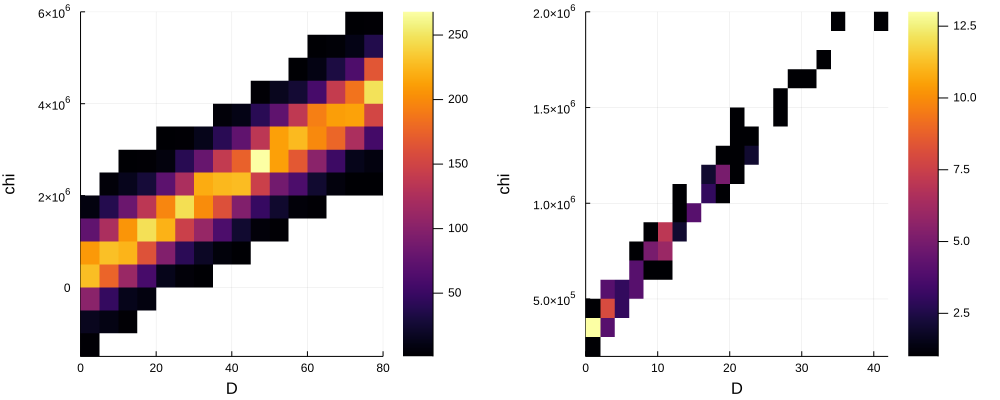

In [25]:
p1 = histogram2d(D2s,chis, xlabel="D",ylabel="chi", nbins=20)
p2 = histogram2d(D2s[idx[end-div(10000,100):end]],chis[idx[end-div(10000,100):end]], xlabel="D",ylabel="chi", nbins=20)
plot(p1,p2, size=(1000,400))

In [41]:
D1 = 66
sample_size = 100
start_time = 360
dt = 10
T = 3600*8
t = start_time:dt:T-dt
meansd = Array{Float64}(undef,sample_size,length(t))
meansd.=0
r2s = Array{Float64}(undef,sample_size)
N = 56#200
N_scouts = 3#10
tD = 4350
r_threshold = 100
r_exp = -2

D2 = mean(D2s[idx[end-div(sample_size,1000):end]])
chi = mean(chis[idx[end-div(sample_size,1000):end]]);


for i = 1:sample_size
    meansd[i,:] = leapfrog_sim(D1,D2,chi,t,N,N_scouts,tD,start_time,r_threshold,r_exp)
    r2s[i] = r2_test(t_rt[5:end],msd_rt[5:end],t,meansd[i,:])
end

In [42]:
means = Array{Float64}(undef,length(t))
medians = Array{Float64}(undef,length(t))
st_e = Array{Float64}(undef,length(t))
std_dev = Array{Float64}(undef,length(t))
for (i,t) in enumerate(t)
    means[i] = mean(meansd[:,i])
    medians[i] = median(meansd[:,i])
    st_e[i] = sem(meansd[:,i])
    std_dev[i] = std(meansd[:,i])
end

r2_median = r2_test(t_rt[5:end],msd_rt[5:end],t,medians)

0.29983396998813583

In [43]:
std_rt[isnan.(std_rt)] .= 0;

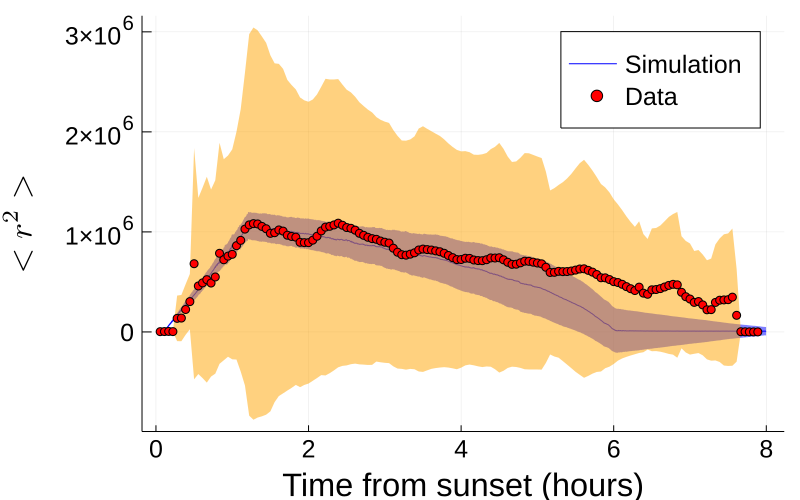

In [44]:

plot(t./3600, medians,xlabel="Time (hours)",ylabel="MSD", ribbon=std_dev, color=:blue, fill=:blue, label="Simulation")
scatter!(t_rt./3600,msd_rt,label="Data", color=:red, ribbon=std_rt, fill=:orange)
plot!(xlabel=string("Time from sunset (hours)"), ylabel=L"<r^2>", 
    markersize=8, 
    size=(800,500),
    tickfontsize=17, guidefontsize=22, legendfontsize=17, margin=2mm)

#savefig(string(path, "figs/RadioTrack_simulation.pdf"))

In [45]:
plot(xlabel="Time (hours)",ylabel="MSD")
for i = 1:sample_size
    plot!(t./3600 ,meansd[i,:],label="")
end
scatter!(t_rt./3600,msd_rt,label="Data")

In [37]:
D2

3.0332706908143514

In [46]:
chi/10^5

5.015464106251148

In [39]:
N

200

In [40]:
N_scouts

10